In [7]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import plotly.graph_objects as go
import h5py
import scipy.integrate as integrate
import scipy.special as special
import sklearn

import tensorflow as tf
import matplotlib.pyplot as plt
from matplotlib import cm
from mpl_toolkits import mplot3d
from sklearn.model_selection import train_test_split

2023-10-06 15:31:03.896801: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
from joblib import Parallel, delayed

In [71]:
import random

In [73]:
def plot_decision_boundary(X, y, clf, mesh_n = 20):
    print(X.shape)
    x1_min, x1_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    x2_min, x2_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx1, xx2 = np.meshgrid(np.arange(x1_min, x1_max, (x1_max - x1_min) / mesh_n),
                           np.arange(x2_min, x2_max, (x2_max - x2_min) / mesh_n))
    
    test_mesh = np.c_[xx1.ravel(), xx2.ravel()]
    #run the model
    Nc = 50
    Nd = test_mesh.shape[0]
    X_class = np.zeros((Nd, Nc))

    #normalize whole dataset
    dataset_norm = feature_to_displacement_2d(test_mesh)
    
    #run reservoir
    X_class = Parallel(n_jobs=13)(delayed(soliton_model)(dataset_norm[i,:], Nc, classification = True) for i in range(dataset_norm.shape[0]))
    
    #find predictions
    Z = clf.predict(X_class)
    Z = Z.reshape(xx1.shape)
    
    plt.contourf(xx1, xx2, Z, alpha=0.3)
    plt.scatter(X[:, 0], X[:, 1], c=y)
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.xlim(xx1.min(), xx1.max())
    plt.ylim(xx2.min(), xx2.max())
    plt.show()

def feature_to_displacement(f, A = 1):
    '''
    input - an array of features. shape (1, NI)
    output - an array of displacements. shape (1, Ns) (here NI = Ns)
    '''
    x = A*(2*(f-np.amin(f))/(np.amax(f)-np.amin(f)) - 1)
    return x

def feature_to_displacement_2d(f, A = 1):
    '''
    input - an array of features. shape (1, NI)
    output - an array of displacements. shape (1, Ns) (here NI = Ns)
    '''
    df = f.copy()
    df[:,0] = A*(2*(f[:,0]-np.amin(f[:,0]))/(np.amax(f[:,0])-np.amin(f[:,0])) - 1)
    df[:,1] = A*(2*(f[:,1]-np.amin(f[:,1]))/(np.amax(f[:,1])-np.amin(f[:,1])) - 1)
    return df

def Toda(x, i):
    
    a = 2
    delta = 4
    C = 4*a**4*np.exp(-a*delta)
    dxidz = C*(x[i+1] - 2*x[i] + x[i-1])

    return dxidz

def Toda_first(x):
    
    a = 2
    delta = 4
    C = 4*a**4*np.exp(-a*delta)
    dxidz = C*(x[1] - 2*x[0] + 0)
    
    return dxidz

def Toda_final(x):
    
    a = 2
    delta = 4
    i = len(x) - 1
    C = 4*a**4*np.exp(-a*delta)
    dxidz = C*(0 - 2*x[i] + x[i-1])
    
    return dxidz

def sys_func(t, y):
    s1, s1vel, s2, s2vel, s3, s3vel, s4, s4vel, s5, s5vel, s6, s6vel, s7, s7vel, s8, s8vel  = y
    pos = np.array([s1, s2, s3, s4, s5, s6, s7, s8])
    dydt = [s1vel, Toda_first(pos), 
            s2vel, Toda(pos, i = 1), 
            s3vel, Toda(pos, i = 2), 
            s4vel, Toda(pos, i = 3),
            s5vel, Toda(pos, i = 4),
            s6vel, Toda(pos, i = 5),
            s7vel, Toda(pos, i = 6),
            s8vel, Toda_final(pos),
            ]
#     dydt = [s1vel + Toda_first(pos),
#             s2vel + Toda(pos, i = 1),
#             s3vel + Toda(pos, i = 2), 
#             s4vel + Toda(pos, i = 3),
#             s5vel + Toda(pos, i = 4),
#             s6vel + Toda(pos, i = 5),
#             s7vel + Toda(pos, i = 6), 
#             s8vel + Toda_final(pos),
#             ]
    return dydt

def build_system(x1, Ns):
    '''
    inputs x1 - first displacement in a raw
    Ns - numbere of solitons
    '''
    x = np.zeros((Ns*2))
    x[0] = x1
    return x

def build_system_classification(x1, x5, Ns):
    '''
    inputs x1, x5 - first and fifth displacement in a raw
    Ns - numbere of solitons
    '''
    x = np.array([x1, 0.1, 0, 0.1, 0, 0.1, 0, 0.1, x5, 0.1, 0, 0.1, 0, 0.1, 0, 0.1])
    return x

def RungeKutta4(func, initials, time):
    '''
    func: function to be integrated
    initials: list of initial conditions
    time: array of independent variable
    '''
    dt = time[1]-time[0]
    dim = len(initials)
    y = np.zeros([dim, time.size]).astype('complex128')
    y[:, 0] = initials
    for j in range(time.size-1):
        y_prev = np.array(y[:, j]).astype('complex128')
        k1=np.array( func(time[j], y_prev) ).astype('complex128')
        k2=np.array( func(time[j]+dt/2, y_prev+k1*dt/2) ).astype('complex128')
        k3=np.array( func(time[j]+dt/2, y_prev+k2*dt/2) ).astype('complex128')
        k4=np.array( func(time[j]+dt, y_prev+k3*dt) ).astype('complex128')
        a=np.zeros([dim]).astype('complex128')
        #for k in range(dim):
        #    a[k] = (k1[k]+2*k2[k]+k4[k]+2*k3[k])*dt/6
        #    y[k, j+1]=y_prev[k]+a[k]
        a = (k1+2*k2+k4+2*k3)*dt/6
        y[:,j+1] = y_prev + a
    y=y.astype('complex128')
    return y

def sech(x):
    return 1/np.cosh(x)

def psi(x, i, vi, disp):
    '''
    pos_i - position of a given soliton's peak
    vi - velocity of the soliton
    delta_i - phase of the soliton = pi*i
    '''
    delta = 4
    delta_i = np.pi * i
    pos_i = (i + 1/2)*delta+disp
    a = 2
    y = np.abs(a*sech(x - pos_i)*np.exp(2*1.j*vi*(x - pos_i)+1.j*delta_i))
    return y

def plot_solitons(t, x, output):
    delta = 4
    Ns = 8

    plt.figure(figsize = (15,5))
    summ1, summf = np.zeros((len(x))), np.zeros((len(x)))
    pos_eqs = []
    for i in range(Ns):

        #first and last position of the 1st soliton
        soliton_position1 = np.real(output[i*2,0])
        soliton_position_final = np.real(output[i*2,-1])

        #assosiated with it velocities
        soliton_velocity1 = np.real(output[i*2+1,0])
        soliton_velocity_final = np.real(output[i*2+1,-1])

        #soliton
        psi1 = psi(x, i, soliton_velocity1, soliton_position1)
        psi_final = psi(x, i, soliton_velocity_final, soliton_position_final)
        
        #sum of solitons
        summ1 = summ1 + psi1
        summf = summf + psi_final
        
        #plot
        if i == 0:
            mylabel1 = '$\\Psi$ at z = 0'
            mylabelf = '$\\Psi$ at z = 50'
        else:
            mylabel1 = None
            mylabelf = None
            
        plt.plot(x, psi1, '--', color = 'orange', linewidth=2, label = mylabel1)
        plt.plot(x, psi_final, color = 'purple', label = mylabelf)
        
        #equilibrium position
        pos_eq = (i + 1/2)*delta
        pos_eqs.append(pos_eq)
        plt.axvline(pos_eq, color = 'blue', linestyle = 'dashdot')
    
    plt.legend(fontsize = 15, loc='lower left')
    plt.xlabel('x', fontsize = 15)
    plt.ylabel('|$\\Psi$|', fontsize = 15)
    plt.title('Initial and final positions of the solitons', fontsize = 20)
    plt.grid()
    plt.show()
    
    plt.figure(figsize = (15, 5))
    plt.plot(x, summ1, '--', color = 'orange', label = '$\\Psi$ at z = 0')
    plt.plot(x, summf, color = 'purple', label = '$\\Psi$ at z = 50')
    for i in range(len(pos_eqs)):
        plt.axvline(pos_eqs[i], color = 'blue', linestyle = 'dashdot')
    plt.legend(fontsize = 15, loc='lower left')
    plt.xlabel('x', fontsize = 15)
    plt.ylabel('|$\\Psi$|', fontsize = 15)
    plt.title('Summed soliton fields', fontsize = 20)
    plt.grid()
    plt.show()
    
    return psi_final
    
def soliton_field(z, x, output):
    summ = np.zeros((len(z), len(x)))
    Ns = 8
    zn = len(z)
    xn = len(x)
    for i in range(Ns):

        psi_field = []
        #map for i-th soliton
        for j in range(50):
            pos = np.abs(output[i*2,j])
            vel = np.abs(output[i*2+1,j])
            psi_field.append(psi(x, i, vel, pos))
        psi_arr = np.array(psi_field)
        #sum of solitons
        summ = summ + psi_arr

    plt.imshow(summ, aspect = 50)

    fig = go.Figure(data=[go.Surface(z=summ)])
    fig.update_layout(title='3D soliton simulation', autosize=False,
                      width=500, height=500,
                      margin=dict(l=65, r=50, b=65, t=90))

    fig.show()
    
    return summ

def psi_for_Y(x, sol):
    '''
    |Psi|**2
    '''
    summ = 0
    Ns = 8
    for i in range(Ns):

        #map for i-th soliton
        pos = np.abs(sol[i*2])
        vel = np.abs(sol[i*2+1])
        psi_arr = psi(x, i, vel, pos)**2
        #sum of solitons
        summ = summ + psi_arr
        
    return summ

def find_Y(X, sol, Nc = 16):
    #separate soliton output field by equaly spaced 16 channels
    #take integral of the function
    Lc = (np.amax(X) - np.amin(X))/Nc
    result = []
    for n in range(0, Nc):
        xmin = X[0] + n*Lc
        xmax = X[0] + (n+1)*Lc
        result.append(integrate.quad(lambda x: psi_for_Y(x, sol[:, -1]), xmin, xmax)[0])

    return result

def xy_data(Nd, seed, plot = False):
    '''
    Nd - number of points
    '''
    xmax = 1
    xmin = -1
    x = np.linspace(xmin,xmax, Nd)
    y_clean = np.sinc(np.pi*x) + 0.5
    
    std = 0.05 * np.std(y_clean)
    np.random.seed(seed)
    noise = np.random.normal(0,std,Nd)
    y = y_clean+noise
    if plot == True:
        plt.plot(x, y_clean, 'b--')
        plt.plot(x, y, '.')
        plt.grid()
    
    return x, y, y_clean

def my_initial(xs):
    y = np.array([xs, 0.1, 0, 0.1, 0, 0.1, 0, 0.1, 0, 0.1, 0, 0.1, 0, 0.1, 0, 0.1])
    return y

def train_class(X, Y, Nc = 50, plot = True, A = 1):
    '''
    X: (2, m)
    Y: (1, m)
    '''
    seed = random.randint(0,100)
    x_train, x_test, y_train, y_test = train_test_split(X.T, Y.T, test_size=0.20, random_state=seed)

    #run the model
    Nd = x_train.shape[0]
    X_class = np.zeros((Nd, Nc))

    #normalize whole dataset
    dataset_norm = feature_to_displacement_2d(x_train, A)
    
    #visualize soliton field
    #datapoint = dataset_norm[0]
    #_ = soliton_model(datapoint, Nc, plot = True, classification = True)
    
    #run reservoir
    X_class = Parallel(n_jobs=13)(delayed(soliton_model)(dataset_norm[i,:], Nc, classification = True) for i in range(dataset_norm.shape[0]))
    
    #Train the logistic regression classifier
    clf = sklearn.linear_model.LogisticRegressionCV(max_iter = 3000);
    y_train = y_train.reshape(Nd,)
    clf.fit(X_class, y_train)
    
    #Find train accuracy
    LR_predictions = clf.predict(X_class)
    
    acc_train = float((np.dot(y_train,LR_predictions) + np.dot(1-y_train,1-LR_predictions))/float(y_train.size)*100)
    print ('Accuracy on train dataset: %d ' % float((np.dot(y_train,LR_predictions) + np.dot(1-y_train,1-LR_predictions))/float(y_train.size)*100) +
           '% ' + "(percentage of correctly labelled datapoints)")
    
    #Find test accuracy
    Nd = x_test.shape[0]
    X_class = np.zeros((Nd, Nc))

    #normalize x test
    dataset_norm = feature_to_displacement_2d(x_test, A)
    
    #run reservoir
    X_class = Parallel(n_jobs=14)(delayed(soliton_model)(dataset_norm[i,:], Nc, classification = True) for i in range(dataset_norm.shape[0]))
    
    y_test = y_test.reshape(Nd,)
    LR_predictions = clf.predict(X_class)
    
    acc_test = float((np.dot(y_test,LR_predictions) + np.dot(1-y_test,1-LR_predictions))/float(y_test.size)*100)
    print ('Accuracy on test dataset: %d ' % float((np.dot(y_test,LR_predictions) + np.dot(1-y_test,1-LR_predictions))/float(y_test.size)*100) +
           '% ' + "(percentage of correctly labelled datapoints)")
    
    if(plot == True):
        plot_decision_boundary(x_test, y_test, clf)
        
    return acc_test

In [11]:
def soliton_model(j, Nc, classification = False, plot = 'False', my_init = False):
    
    #parameters
    Ns = 8
    delta = 4
    t = np.arange(0, 50, 1)
    x = np.arange(0, 8*4, 0.01)
    
    #build 8 solitons system for first example in the normolized dataset
    if classification == True:
        x_initial = build_system_classification(j[0], j[1], Ns = Ns)
    if my_init == True:
        x_initial = my_initial(j)
    
    #compute propagation of the solitons through the media in a z-direction
    sol = RungeKutta4(func = sys_func, initials = x_initial, time = t)

    #plot the evolution of solitons displacements and add-up solitons
    if plot == True:
        
        plot_solitons(t, x, sol)
    
        #plot soliton field
        sol_field = soliton_field(t, x, sol)
    
    #find Y
    Y = find_Y(x, sol, Nc)
    
    return Y

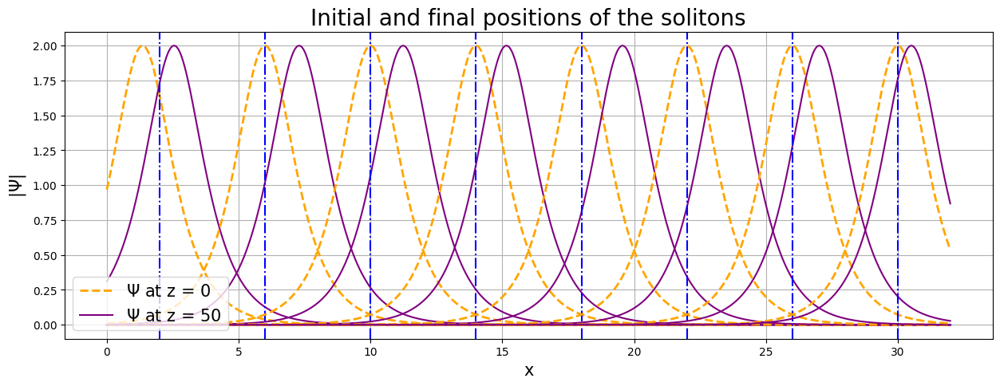

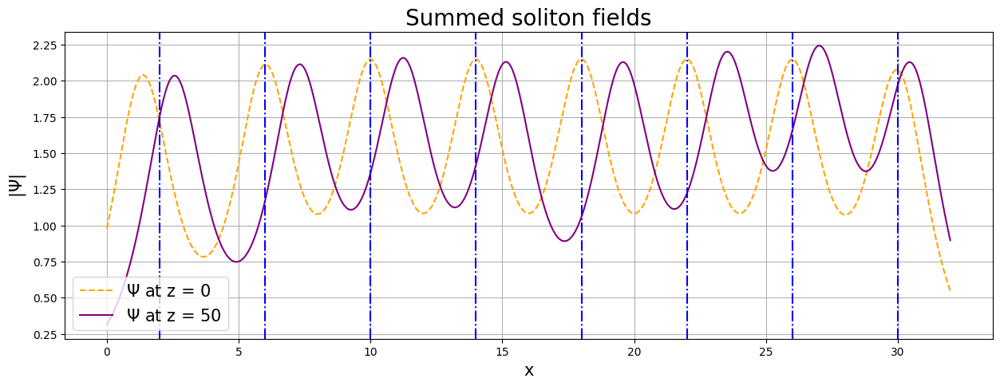

Accuracy on test set: 80 % (percentage of correctly labelled datapoints)


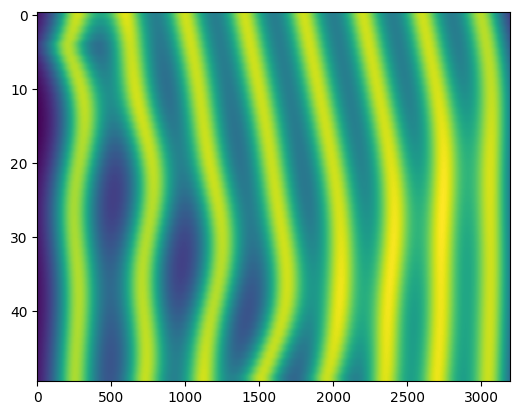

In [68]:
Y = {}
Nc = 16
Nd = 200
Y_arr = np.zeros((Nd, Nc))
#run the model
x, dataset, y_expected = xy_data(Nd, seed = 0)
#normolize whole dataset
dataset_norm = feature_to_displacement(dataset)

datapoint = dataset_norm[0]
_ = soliton_model(datapoint, Nc, plot = True, my_init = True)

for i, datapoint in enumerate (dataset_norm):
    Y_arr[i] = soliton_model(datapoint, Nc, my_init = True)

#Moore-Penrose Inverse
A_MP = np.linalg.pinv(Y_arr, rcond=1e-15, hermitian=False)

#the weights
W = np.dot(A_MP, y_expected)

y_predicted = np.dot(Y_arr, W)

y_acc = float((np.dot(y_expected,y_predicted) + np.dot(1-y_expected,1-y_predicted))/float(y_expected.size)*100)
#print ('Accuracy on train set: %d ' % y_acc +
#           '% ' + "(percentage of correctly labelled datapoints)")

#new random data
x, dataset, y_expected = xy_data(Nd, seed = 2)
dataset_norm = feature_to_displacement(dataset)
for i, datapoint in enumerate (dataset_norm):
    Y_arr[i] = soliton_model(datapoint, Nc, my_init = True)

y_predicted = np.dot(Y_arr, W)

y_acc_test = float((np.dot(y_expected,y_predicted) + np.dot(1-y_expected,1-y_predicted))/float(y_expected.size)*100)
print ('Accuracy on test set: %d ' % y_acc_test +
           '% ' + "(percentage of correctly labelled datapoints)")


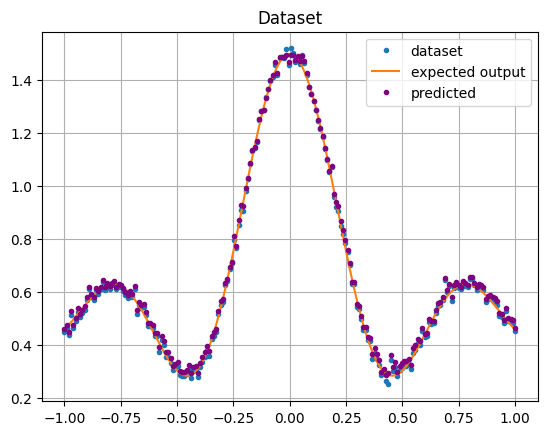

In [69]:
plt.plot(x, dataset, '.', label = 'dataset')
plt.plot(x, y_expected, label = 'expected output')
plt.plot(x, y_predicted, '.', color = 'purple', label = 'predicted')
plt.grid()
plt.title('Dataset')
plt.legend()

### Classification task

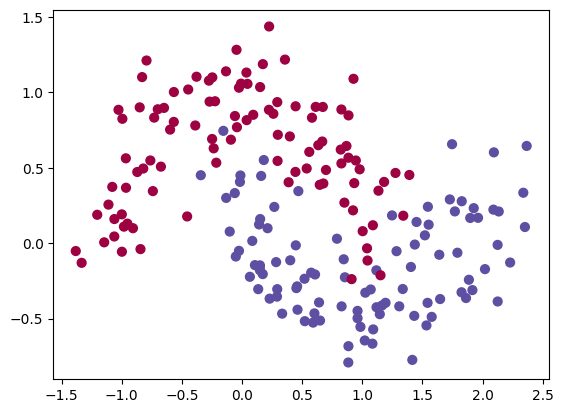

In [9]:
# Datasets
# Package imports
import numpy as np
import matplotlib.pyplot as plt
import sklearn
import sklearn.datasets
import sklearn.linear_model
from planar_utils import sigmoid, load_planar_dataset, load_extra_datasets


noisy_circles, noisy_moons, blobs, gaussian_quantiles, no_structure = load_extra_datasets()

datasets = {"noisy_circles": noisy_circles,
            "noisy_moons": noisy_moons,
            "blobs": blobs,
            "gaussian_quantiles": gaussian_quantiles}

### START CODE HERE ### (choose your dataset)
dataset = "noisy_moons"
### END CODE HERE ###

X, Y = datasets[dataset]
X, Y = X.T, Y.reshape(1, Y.shape[0])

# make blobs binary
if dataset == "blobs":
    Y = Y%2

# Visualize the data
plt.scatter(X[0, :], X[1, :], c=Y, s=40, cmap=plt.cm.Spectral);

Accuracy on train dataset: 96 % (percentage of correctly labelled datapoints)
Accuracy on test dataset: 90 % (percentage of correctly labelled datapoints)
(40, 2)


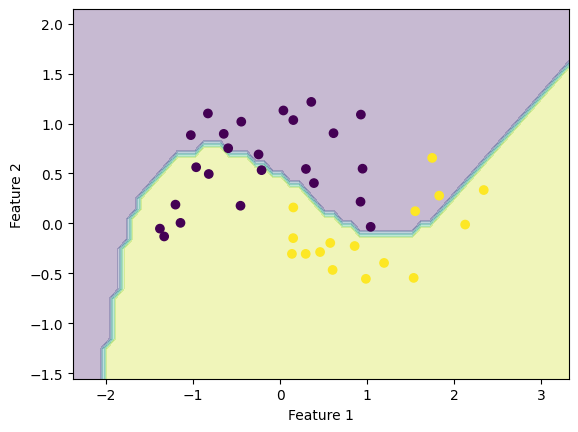

In [12]:
train_class(X, Y)

### Spiral dataset

In [87]:
seed = 7
np.random.seed(seed)

def spirals(points, noise=.5):
    n = np.sqrt(np.random.rand(points,1)) * 780 * (2*np.pi)/360
    d1x = -np.cos(n)*n + np.random.rand(points,1) * noise
    d1y = np.sin(n)*n + np.random.rand(points,1) * noise
    return (np.vstack((np.hstack((d1x,d1y)),np.hstack((-d1x,-d1y)))), 
            np.hstack((np.zeros(points),np.ones(points))))


X, Y = spirals(1000)

Accuracy on train dataset: 73 % (percentage of correctly labelled datapoints)
Accuracy on test dataset: 74 % (percentage of correctly labelled datapoints)
(400, 2)


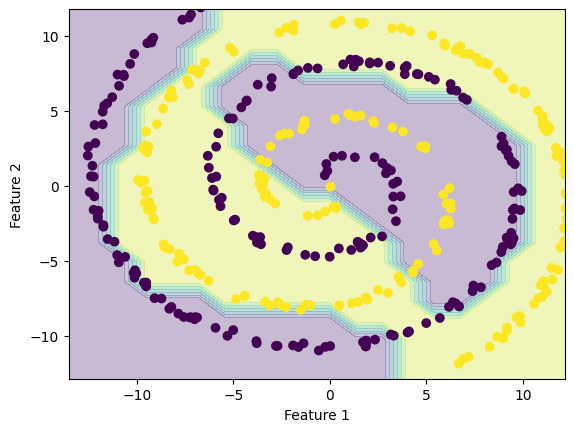

74.75

In [23]:
train_class(X.T, Y.T)

### What if there is no reservoir

In [82]:
random.randint(0,100)

33

In [91]:
def no_reservoir(X, Y, Nc = 50, plot = False, A = 1):
    
    x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.20, random_state=random.randint(0,100))   
        #run the model
    Nd = x_train.shape[0]
    X_class = np.zeros((Nd, Nc))

    #normalize whole dataset
    dataset_norm = feature_to_displacement_2d(x_train, A)

    #initial data
    x_initial = np.array(Parallel(n_jobs=13)(delayed(build_system_classification)(dataset_norm[i,0], dataset_norm[i,1], Ns=8) for i in range(dataset_norm.shape[0])))
    #find integrals
    x_mesh = np.arange(0, 8*4, 0.01)
    X_class = np.array(Parallel(n_jobs=13)(delayed(find_Y)(x_mesh, x_initial, Nc = Nc) for i in range(dataset_norm.shape[0])))

    y_train = y_train.reshape(Nd,)
    #train model on input data
    clf = sklearn.linear_model.LogisticRegressionCV(max_iter = 3000);
    clf.fit(X_class, y_train)

    #Find train accuracy
    LR_predictions = clf.predict(X_class)

    acc_train = float((np.dot(y_train,LR_predictions) + np.dot(1-y_train,1-LR_predictions))/float(y_train.size)*100)
    print ('Accuracy on train dataset: %d ' % acc_train +
               '% ' + "(percentage of correctly labelled datapoints)")

    #normalize whole dataset
    dataset_norm = feature_to_displacement_2d(x_test, A)

    Nd = x_test.shape[0]
    #initial data
    x_initial = np.array(Parallel(n_jobs=13)(delayed(build_system_classification)(dataset_norm[i,0], dataset_norm[i,1], Ns=8) for i in range(dataset_norm.shape[0])))
    #find integrals
    x_mesh = np.arange(0, 8*4, 0.01)
    X_class = np.array(Parallel(n_jobs=13)(delayed(find_Y)(x_mesh, x_initial, Nc = Nc) for i in range(dataset_norm.shape[0])))

    y_test = y_test.reshape(Nd,)
    LR_predictions = clf.predict(X_class)
    acc_test = float((np.dot(y_test,LR_predictions) + np.dot(1-y_test,1-LR_predictions))/float(y_test.size)*100)
    print ('Accuracy on test dataset: %d ' % acc_test +
               '% ' + "(percentage of correctly labelled datapoints)")
    if plot == True:
        plot_decision_boundary(x_test, y_test, clf)
    return acc_test

Accuracy on train dataset: 50 % (percentage of correctly labelled datapoints)
Accuracy on test dataset: 50 % (percentage of correctly labelled datapoints)
(400, 2)


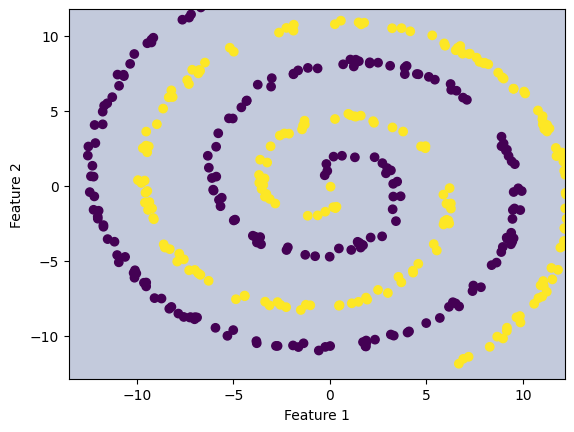

50.0

In [60]:
no_reservoir(X, Y, plot = True)

### Test accuracy as a function of Nc (Number of output channels)

In [89]:
def test_acc(Nc_range, X, Y, A = 1):
    accuracies = np.array(Parallel(n_jobs=14)(delayed(train_class)(X.T, Y.T, Nc, False, A) for Nc in Nc_range))
    return accuracies

def test_acc_no_reservoir(Nc_range, X, Y):
    accuracies = np.array(Parallel(n_jobs=14)(delayed(no_reservoir)(X, Y, Nc, False) for Nc in Nc_range))
    return accuracies

In [ ]:
Nc_range = range(1, 50, 3)
accuracies = test_acc(Nc_range, X, Y)
accuracies_A_025 = test_acc(Nc_range, X, Y, A = 0.25)


In [90]:
accuracies_nrv = test_acc_no_reservoir(Nc_range, X, Y)

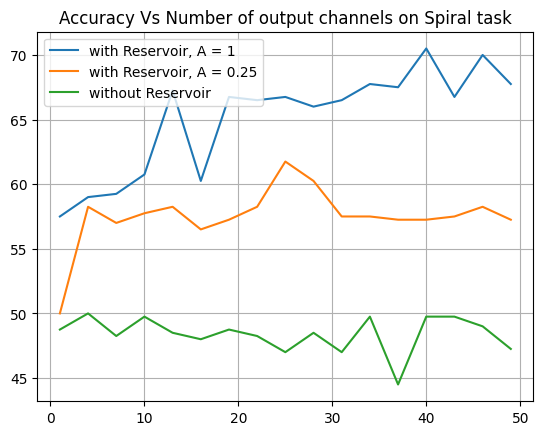

Accuracy on train dataset: 50 % (percentage of correctly labelled datapoints)
Accuracy on test dataset: 48 % (percentage of correctly labelled datapoints)
Accuracy on train dataset: 50 % (percentage of correctly labelled datapoints)
Accuracy on test dataset: 48 % (percentage of correctly labelled datapoints)
Accuracy on train dataset: 50 % (percentage of correctly labelled datapoints)
Accuracy on test dataset: 47 % (percentage of correctly labelled datapoints)
Accuracy on train dataset: 50 % (percentage of correctly labelled datapoints)
Accuracy on test dataset: 49 % (percentage of correctly labelled datapoints)
Accuracy on train dataset: 50 % (percentage of correctly labelled datapoints)
Accuracy on test dataset: 50 % (percentage of correctly labelled datapoints)
Accuracy on train dataset: 50 % (percentage of correctly labelled datapoints)
Accuracy on test dataset: 48 % (percentage of correctly labelled datapoints)
Accuracy on train dataset: 50 % (percentage of correctly labelled data

/home/zmiche/anaconda3/envs/tf/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy on train dataset: 50 % (percentage of correctly labelled datapoints)
Accuracy on test dataset: 49 % (percentage of correctly labelled datapoints)
Accuracy on train dataset: 51 % (percentage of correctly labelled datapoints)
Accuracy on test dataset: 44 % (percentage of correctly labelled datapoints)
Accuracy on train dataset: 50 % (percentage of correctly labelled datapoints)
Accuracy on test dataset: 49 % (percentage of correctly labelled datapoints)
Accuracy on train dataset: 50 % (percentage of correctly labelled datapoints)
Accuracy on test dataset: 48 % (percentage of correctly labelled datapoints)
Accuracy on train dataset: 50 % (percentage of correctly labelled datapoints)
Accuracy on test dataset: 49 % (percentage of correctly labelled datapoints)
Accuracy on train dataset: 50 % (percentage of correctly labelled datapoints)
Accuracy on test dataset: 48 % (percentage of correctly labelled datapoints)
Accuracy on train dataset: 50 % (percentage of correctly labelled data

In [92]:
plt.plot(Nc_range, accuracies, label = 'with Reservoir, A = 1')
plt.plot(Nc_range, accuracies_A_025, label = 'with Reservoir, A = 0.25')
plt.plot(Nc_range, accuracies_nrv, label = 'without Reservoir')
plt.title('Accuracy Vs Number of output channels on Spiral task')
plt.grid()
plt.legend()